<h1><font color=darkred size=6><center> $\fbox{Classification Multimodale - Rakuten}$ </center></h1>
<font color=dimgrey size=3><center> $Bryan, \space Rizlène, \space Romain\space et \space Steeve$ </center></h1>

# Table des matières

## [Importation des librairies](#Imp)

## [Preprocessing](#Preprocess)
[1. Redimensionnement](#Redim)

[2. Normalisation](#Norm)

[3. Augmentation d'image](#Augment)

[4. Conversion en niveaux de gris](#Gray)

[5. Découpage (Cropping)](#Decoup)

[6. Augmentation et Découpage (Cropping)](#Augment_Decoup)

[7. Filtrage](#Filtre)

[8. Ajout de bruit](#Bruit)

[9. Conversion en tenseur](#Tenseur)

## [Bibliographies](#Bibli)

<h2><font size=6> Importation des librairies<a name="Imp"></a></h2>

In [1]:
import os
import csv
import warnings

from PIL import Image, ImageFilter
from IPython.display import display
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

warnings.filterwarnings('ignore')
pd.options.display.max_rows = 500
pd.options.display.max_columns = None

<h2><font size=6> Preprocessing <a name="Preprocess"></a></h2>

Dans un projet de classification d'image, le prétraitement des images est une étape cruciale qui peut grandement influencer la performance d'un modèle de deep learning. 


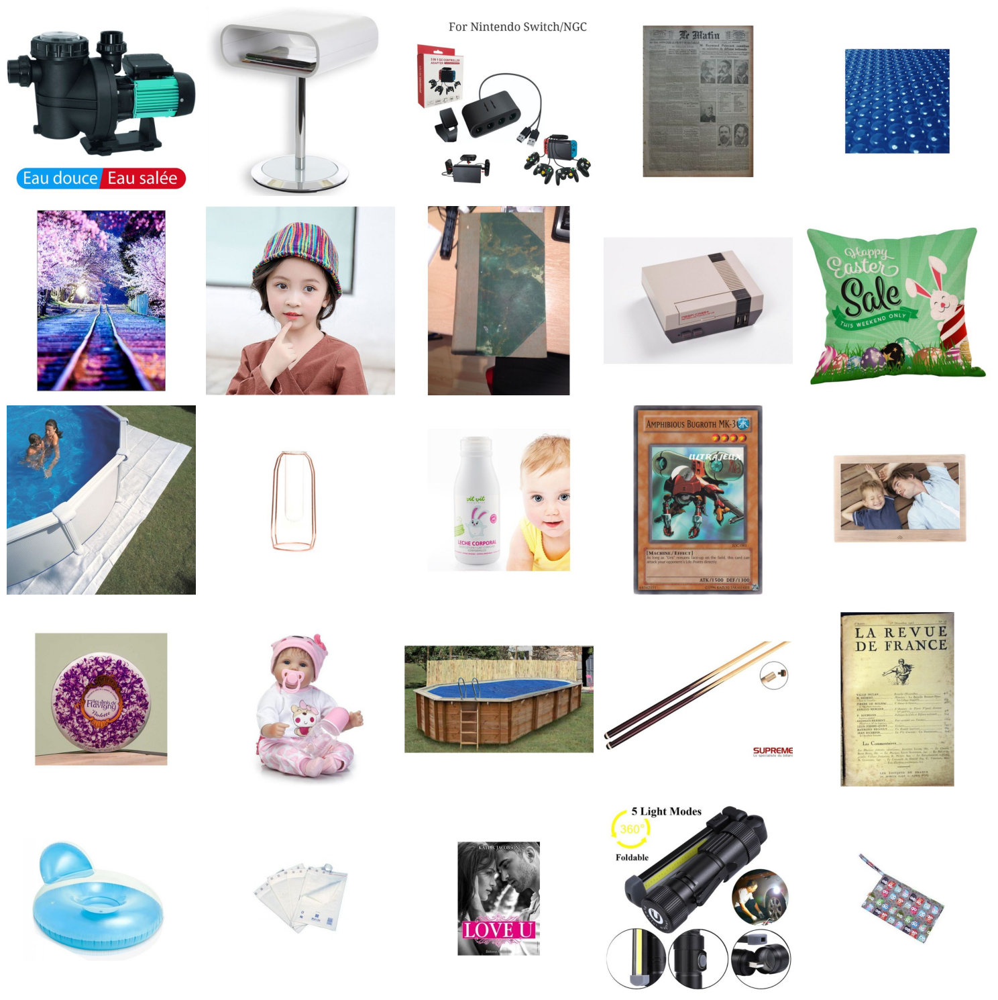

In [2]:
# Chemin vers le dossier contenant les images
dossier_images = "/Users/grizzly/Desktop/DataScientest/rakuten-multimodal-classification/data/images/image_train"

# Liste des fichiers dans le dossier
fichiers_images = os.listdir(dossier_images)

# Filtrer pour ne garder que les fichiers d'images (par exemple, .jpg)
fichiers_images = [f for f in fichiers_images if f.endswith('.jpg')]

# Prendre les 25 premières images
images_a_afficher = fichiers_images[:25]

# Créer une figure pour afficher les images
plt.figure(figsize=(15, 15))

for i, fichier in enumerate(images_a_afficher):
    # Ouvrir l'image
    image = Image.open(os.path.join(dossier_images, fichier))
    
    # Ajouter une sous-figure
    plt.subplot(5, 5, i + 1)  # 2 lignes, 3 colonnes
    plt.imshow(image)
    plt.axis('off')  # Ne pas afficher les axes
    #plt.title(fichier)  # Titre avec le nom du fichier

# Afficher toutes les images
plt.tight_layout()
plt.show()

<h3><font size=5> 1. Redimensionnement <a name="Redim"></a></h3>

Certains modèles de deep learning, comme les réseaux de neurones convolutifs (CNN), nécessitent des entrées de taille fixe. Le redimensionnement garantit que toutes les images ont la même dimension, ce qui est essentiel pour le traitement par lots et l'entraînement du modèle.

In [3]:
def resize(image, target_size):
    return image.resize(target_size)


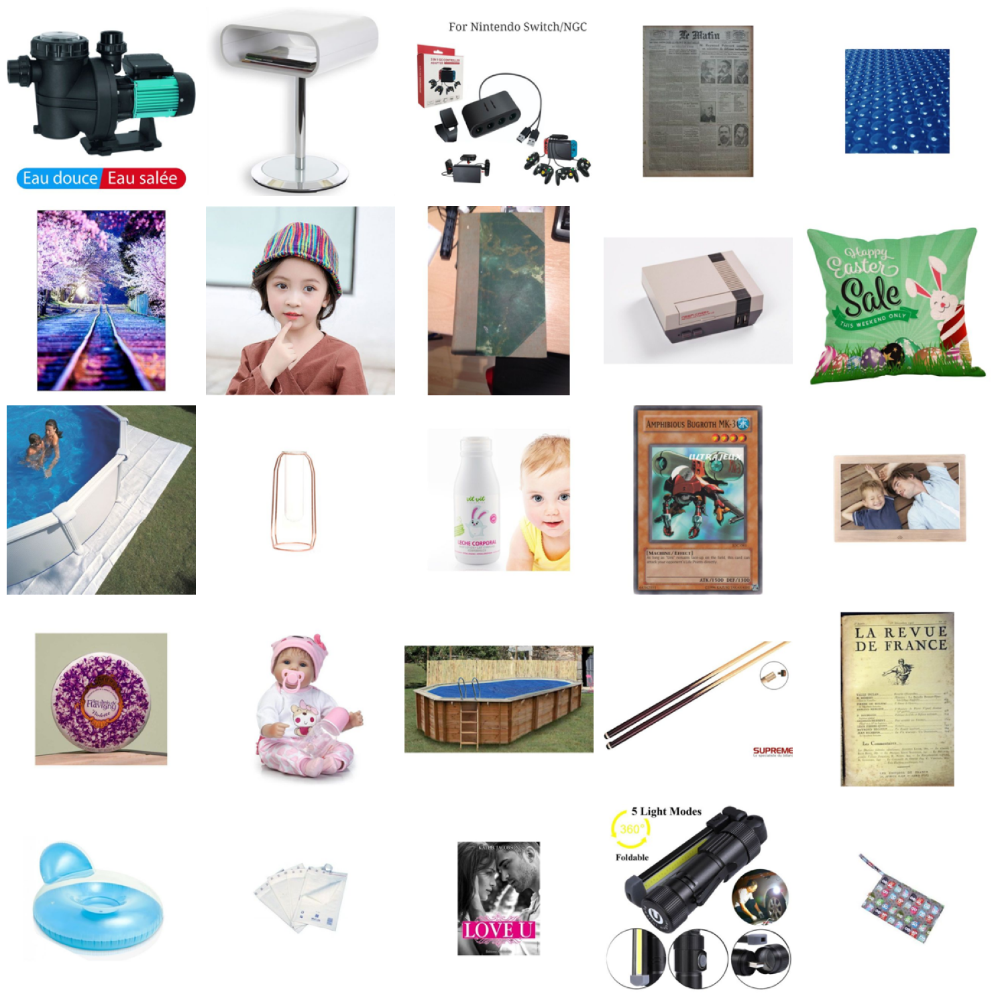

In [4]:
# Créer une figure pour afficher les images
plt.figure(figsize=(15, 15))

for i, fichier in enumerate(images_a_afficher):
    # Ouvrir l'image
    image = Image.open(os.path.join(dossier_images, fichier))
    
    # Redimensionner l'image à 224x224 pixels
    resized_image = resize(image, (224, 224))
    
    # Ajouter une sous-figure
    plt.subplot(5, 5, i + 1)  # 5 lignes, 3 colonnes
    plt.imshow(resized_image)
    plt.axis('off')  # Ne pas afficher les axes
    #plt.title(fichier)  # Titre avec le nom du fichier

# Afficher toutes les images
plt.tight_layout()
plt.show()

<h3><font size=5> 2. Normalisation <a name="Norm"></a></h3>

La normalisation des valeurs de pixel (généralement entre 0 et 1 ou avec une moyenne de 0 et un écart type de 1) aide à stabiliser l'apprentissage. Cela permet au modèle de converger plus rapidement et d'éviter des problèmes liés à des valeurs de pixel très élevées ou très basses.

In [5]:
def normalize(image, mean, std):
    image_array = np.array(image) / 255.0  # Normaliser entre 0 et 1
    return (image_array - mean) / std


In [6]:
normalized_image = normalize(resized_image, mean=0.5, std=0.5)
normalized_image


array([[[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       ...,

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]]], shape=(224, 224, 3))

<h3><font size=5> 3. Augmentation d'image <a name="Augment"></a></h3>

L'augmentation d'image génère des variations des images d'entraînement, ce qui aide à améliorer la robustesse du modèle. Cela permet de réduire le surapprentissage (overfitting) en exposant le modèle à une plus grande diversité de données, même si le nombre d'images d'origine est limité.

In [7]:
def augment(image):
    if random.random() > 0.25:
        image = image.rotate(random.randint(0, 90))  # Rotation aléatoire
    if random.random() > 0.25:
        image = image.transpose(Image.FLIP_LEFT_RIGHT)  # Retournement horizontal
    return image


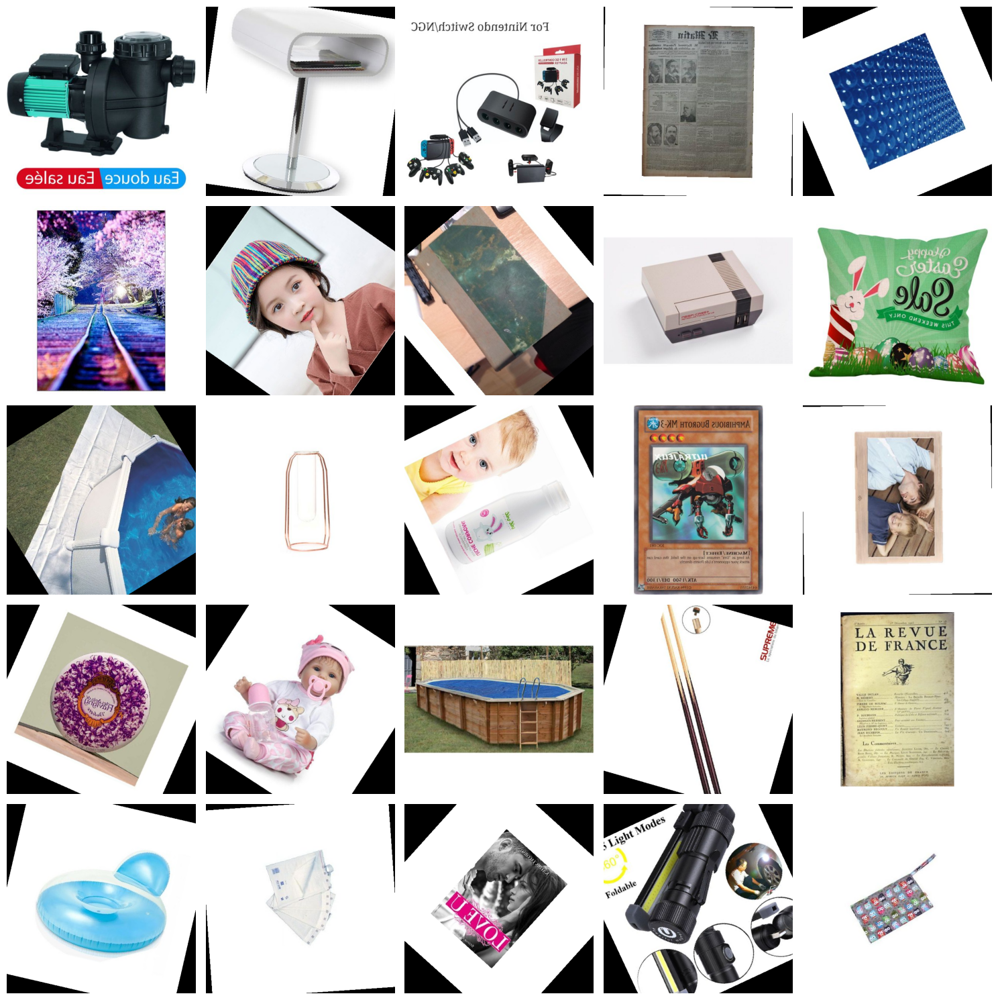

In [8]:
# Créer une figure pour afficher les images
plt.figure(figsize=(15, 15))

for i, fichier in enumerate(images_a_afficher):
    # Ouvrir l'image
    image = Image.open(os.path.join(dossier_images, fichier))
    
    # Augmenter l'image
    augmented_image = augment(image)
    
    # Ajouter une sous-figure
    plt.subplot(5, 5, i + 1)  # 5 lignes, 5 colonnes
    plt.imshow(augmented_image)
    plt.axis('off')  # Ne pas afficher les axes
    #plt.title(fichier)  # Titre avec le nom du fichier

# Afficher toutes les images
plt.tight_layout()
plt.show()

<h3><font size=5> 4. Conversion en niveaux de gris <a name="Gray"></a></h3>

Pour certaines tâches de classification, les informations de couleur peuvent ne pas être nécessaires. La conversion en niveaux de gris peut simplifier le modèle et réduire le temps de calcul, tout en conservant les caractéristiques essentielles de l'image.

In [9]:
def to_grayscale(image):
    return image.convert("L")


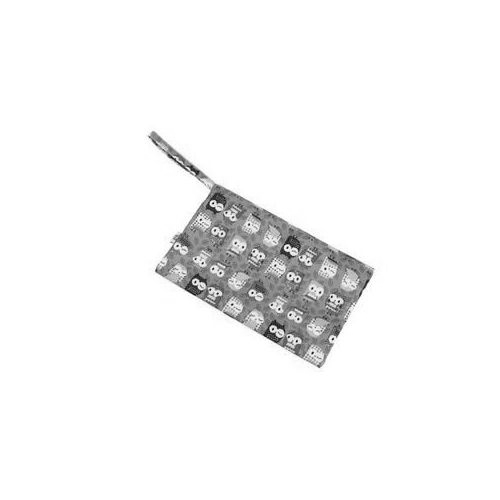

In [10]:
grayscale_image = to_grayscale(image)
display(grayscale_image)


<h3><font size=5> 5. Découpage (Cropping) <a name="Decoup"></a></h3>

Le découpage permet de se concentrer sur des régions spécifiques de l'image, ce qui peut être utile lorsque l'objet d'intérêt est au centre ou dans une zone particulière. Cela peut également aider à réduire le bruit de fond.

In [11]:
def crop(image, x, y, width, height):
    return image.crop((x, y, x + width, y + height))


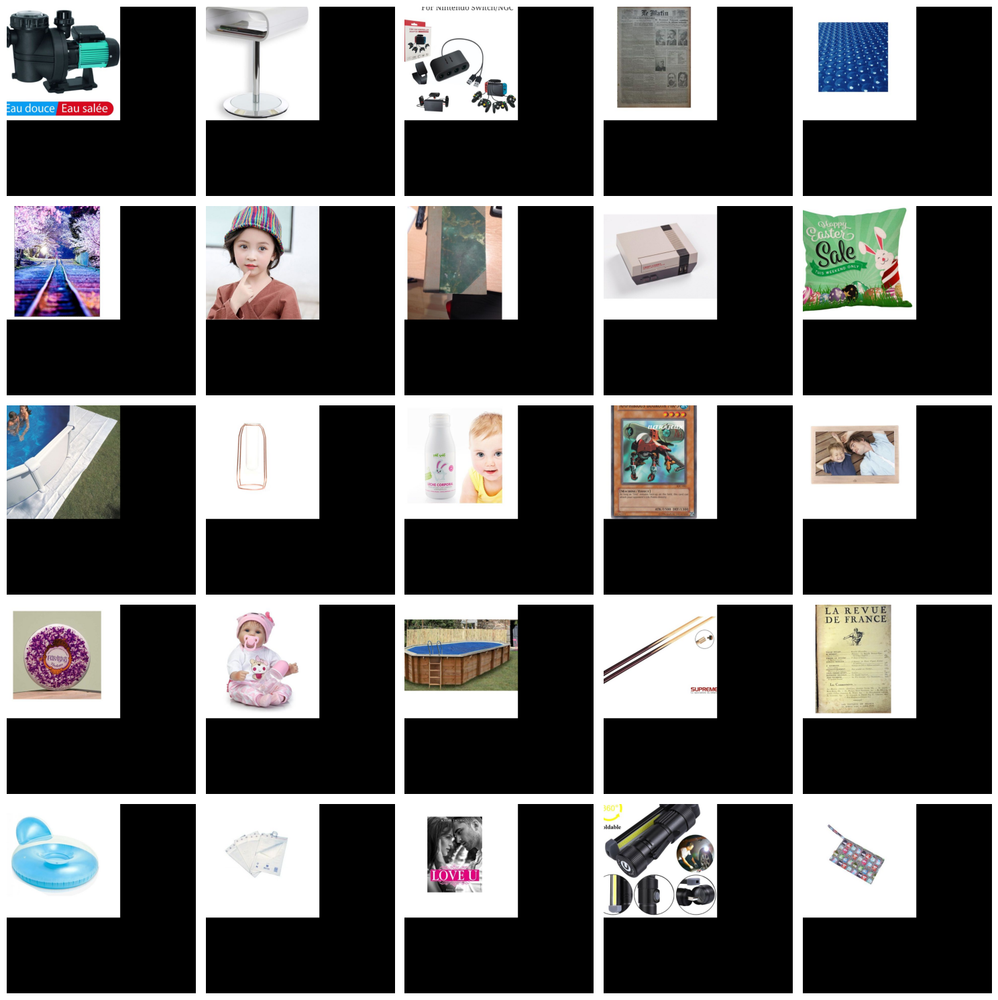

In [12]:
# Créer une figure pour afficher les images
plt.figure(figsize=(15, 15))

for i, fichier in enumerate(images_a_afficher):
    # Ouvrir l'image
    image = Image.open(os.path.join(dossier_images, fichier))
    
    # Augmenter l'image
    cropped_image = crop(image, 50, 50, 750, 750)
    
    # Ajouter une sous-figure
    plt.subplot(5, 5, i + 1)  # 5 lignes, 5 colonnes
    plt.imshow(cropped_image)
    plt.axis('off')  # Ne pas afficher les axes
    #plt.title(fichier)  # Titre avec le nom du fichier

# Afficher toutes les images
plt.tight_layout()
plt.show()

<h3><font size=5> 6. Augmentation et Découpage (Cropping) <a name="Augment_Decoup"></a></h3>

In [13]:
def augment_and_crop(image, crop_size, scale_factor):
    # Appliquer une augmentation d'image (rotation aléatoire)
    if random.random() > 0.25:
        angle = random.randint(0, 90)
        image = image.rotate(angle)

    # Redimensionner l'image pour réduire la taille de l'objet
    new_size = (int(image.width * scale_factor), int(image.height * scale_factor))
    image = image.resize(new_size, Image.LANCZOS)

    # Découper l'image pour repositionner l'objet en haut à droite
    width, height = image.size
    x = width - crop_size[0]  # Position x pour le coin supérieur droit
    y = 0  # Position y pour le coin supérieur droit

    # Vérifier que la taille de découpe ne dépasse pas les dimensions de l'image
    if x < 0 or y + crop_size[1] > height:
        raise ValueError("La taille de découpe dépasse les dimensions de l'image.")

    cropped_image = image.crop((x, y, x + crop_size[0], y + crop_size[1]))
    return cropped_image



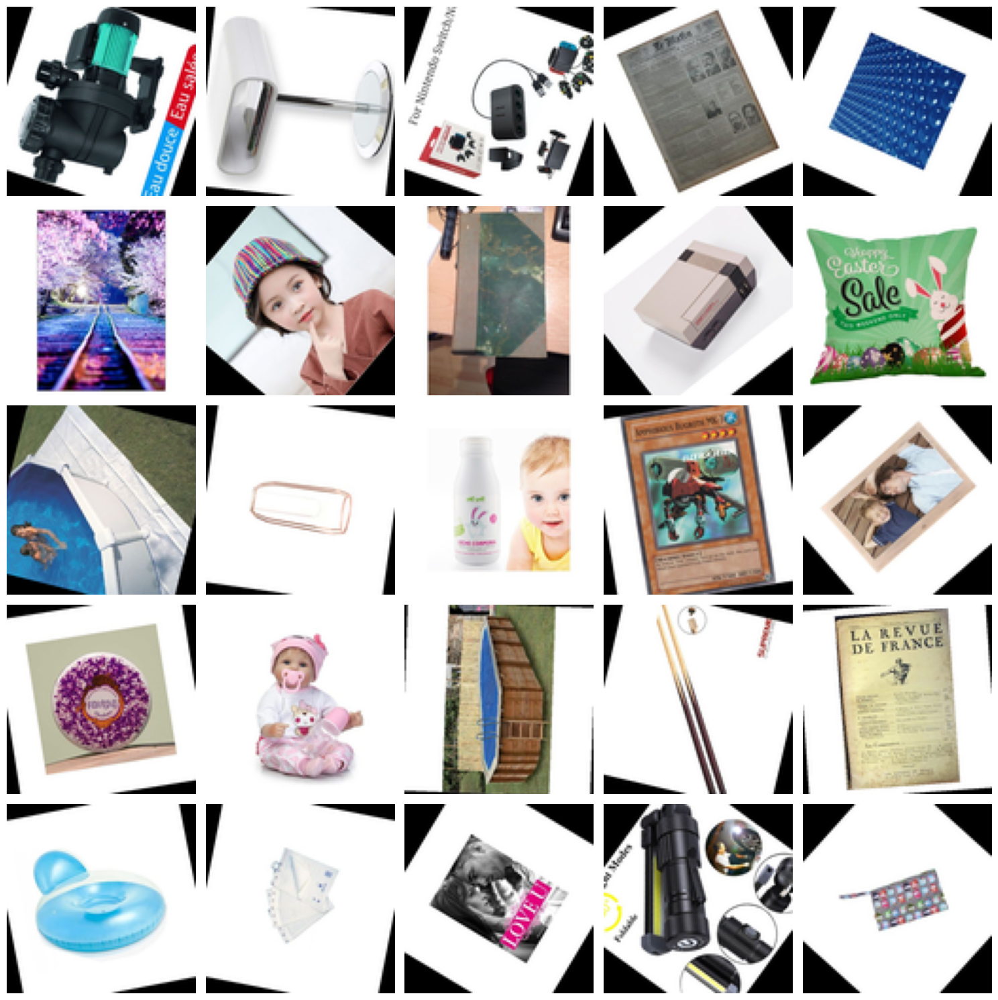

In [14]:
# Créer une figure pour afficher les images
plt.figure(figsize=(15, 15))

for i, fichier in enumerate(images_a_afficher):
    # Ouvrir l'image
    image = Image.open(os.path.join(dossier_images, fichier))
    
    crop_size = (100,100)  # Taille de découpe souhaitée
    scale_factor = 0.20 # Réduire l'image à 50% de sa taille d'origine
    result_image = augment_and_crop(image, crop_size, scale_factor)
    
    # Ajouter une sous-figure
    plt.subplot(5, 5, i + 1)  # 5 lignes, 5 colonnes
    plt.imshow(result_image)
    plt.axis('off')  # Ne pas afficher les axes
    #plt.title(fichier)  # Titre avec le nom du fichier

# Afficher toutes les images
plt.tight_layout()
plt.show()

<h3><font size=5> 7. Filtrage <a name="Filtre"></a></h3>

In [15]:
def filter_image(image, filter_type):
    if filter_type == 'blur':
        return image.filter(ImageFilter.BLUR)
    elif filter_type == 'sharpen':
        return image.filter(ImageFilter.SHARPEN)
    return image


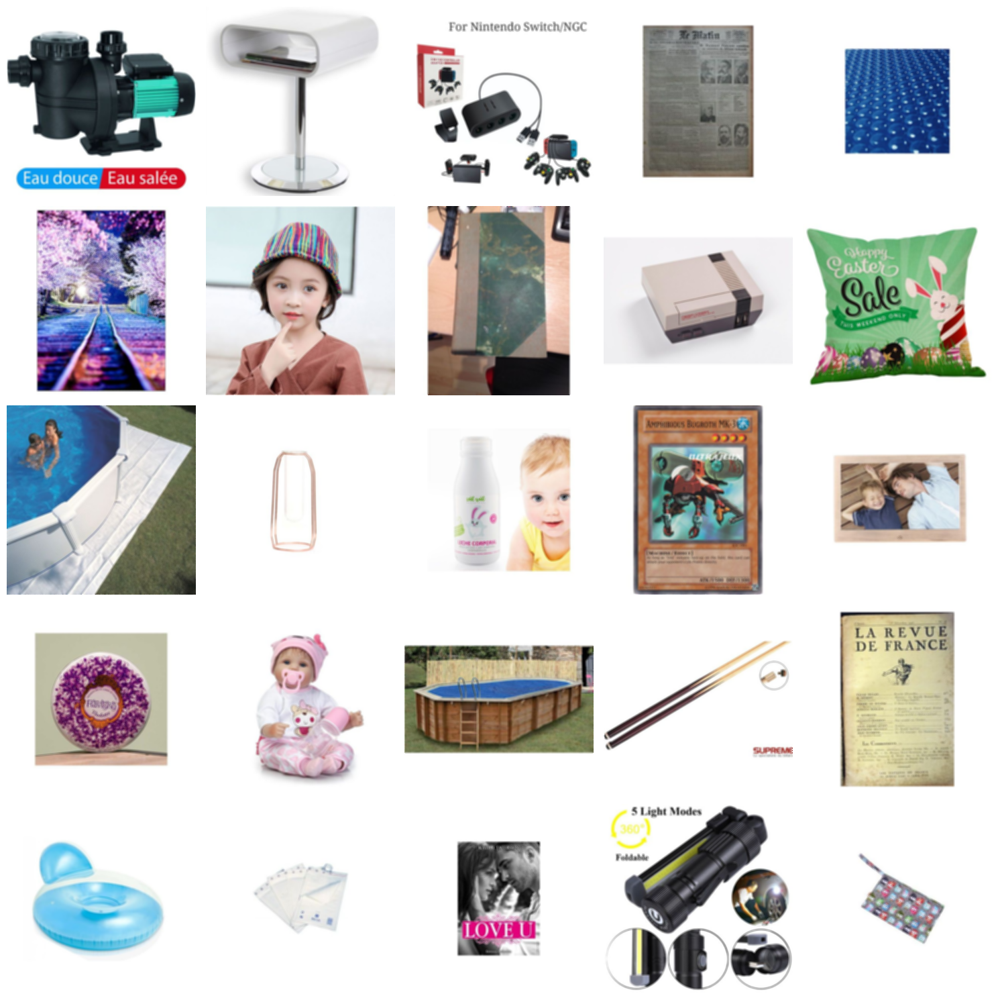

In [16]:
# Créer une figure pour afficher les images
plt.figure(figsize=(15, 15))

for i, fichier in enumerate(images_a_afficher):
    # Ouvrir l'image
    image = Image.open(os.path.join(dossier_images, fichier))

    blurred_image = filter_image(image, 'blur')

    # Ajouter une sous-figure
    plt.subplot(5, 5, i + 1)  # 5 lignes, 5 colonnes
    plt.imshow(blurred_image)
    plt.axis('off')  # Ne pas afficher les axes
    #plt.title(fichier)  # Titre avec le nom du fichier

# Afficher toutes les images
plt.tight_layout()
plt.show()

<h3><font size=5> 8. Ajout de bruit <a name="Bruit"></a></h3>

L'ajout de bruit peut rendre le modèle plus robuste en l'exposant à des données moins parfaites. Cela simule des conditions réelles où les images peuvent être bruitées ou de mauvaise qualité.

In [17]:
def add_noise(image, noise_type='gaussian'):
    image_array = np.array(image)
    if noise_type == 'gaussian':
        noise = np.random.normal(0, 100, image_array.shape)  # Bruit gaussien
        noisy_image = np.clip(image_array + noise, 0, 255)
        return Image.fromarray(np.uint8(noisy_image))
    return image


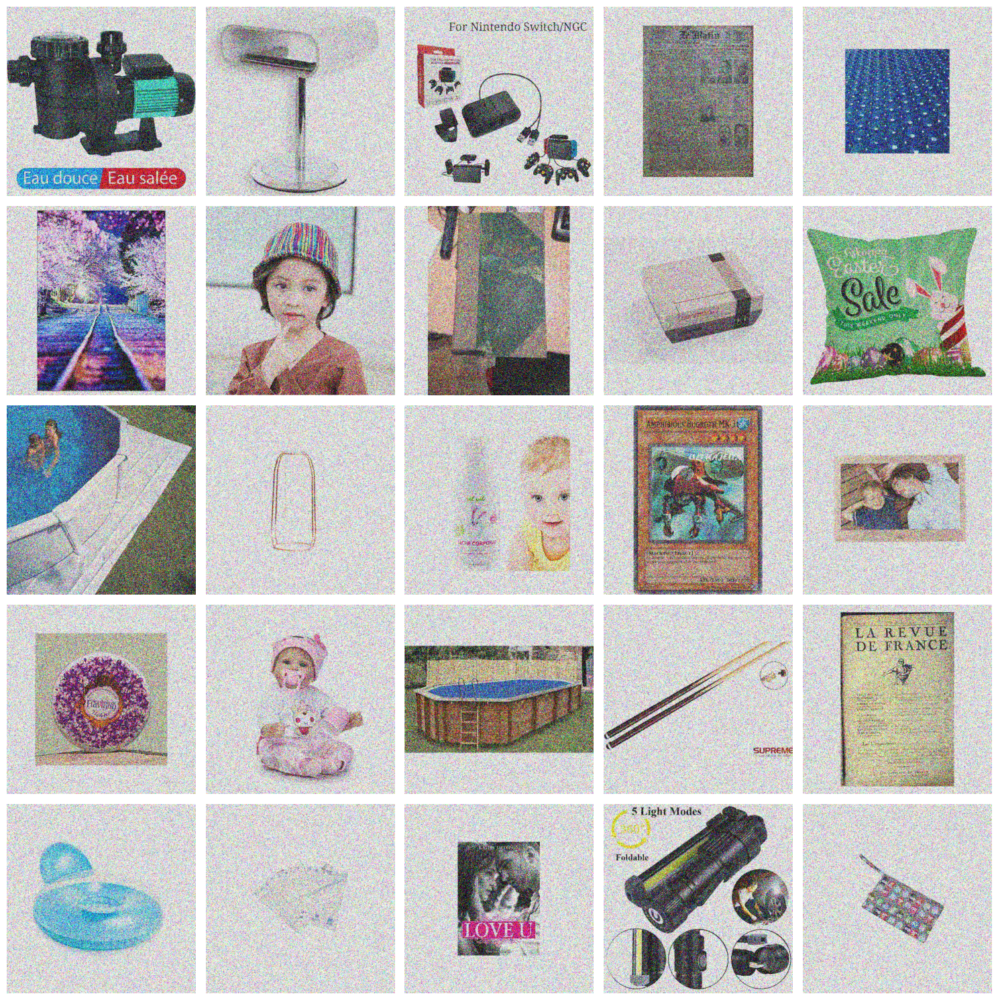

In [18]:
# Créer une figure pour afficher les images
plt.figure(figsize=(15, 15))

for i, fichier in enumerate(images_a_afficher):
    # Ouvrir l'image
    image = Image.open(os.path.join(dossier_images, fichier))

    noisy_image = add_noise(image)

    # Ajouter une sous-figure
    plt.subplot(5, 5, i + 1)  # 5 lignes, 5 colonnes
    plt.imshow(noisy_image)
    plt.axis('off')  # Ne pas afficher les axes
    #plt.title(fichier)  # Titre avec le nom du fichier

# Afficher toutes les images
plt.tight_layout()
plt.show()

<h3><font size=5> 9. Conversion en tenseur <a name="Tenseur"></a></h3>

La conversion des images en tenseurs est nécessaire pour les bibliothèques de deep learning comme TensorFlow ou PyTorch. Cela permet de manipuler les images sous forme de tableaux numériques, facilitant ainsi leur traitement par le modèle.

In [19]:
def to_tensor(image):
    return np.array(image).astype(np.float32)  # Convertir en tenseur (numpy array)

In [20]:
tensor_image = to_tensor(image)
tensor_image


array([[[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       ...,

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 2

En résumé, ces fonctions de prétraitement aident à préparer les données d'image de manière à ce qu'elles soient optimales pour l'entraînement d'un modèle de classification. Elles améliorent la qualité des données, augmentent la diversité des échantillons d'entraînement, et aident à réduire le surapprentissage, ce qui conduit à des modèles plus performants et généralisables.